## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

### Read calibration images and fill objpoints and imgpoints for calibration

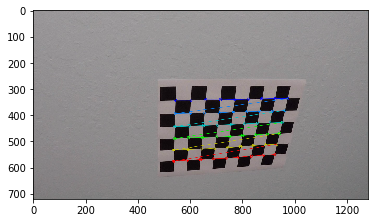

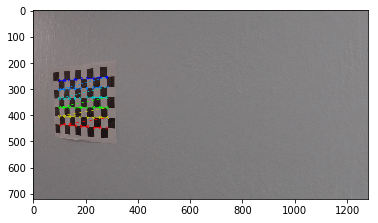

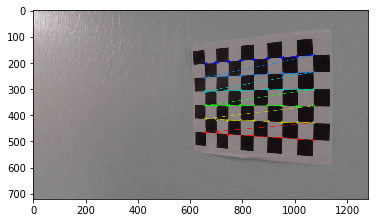

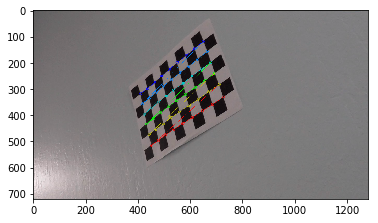

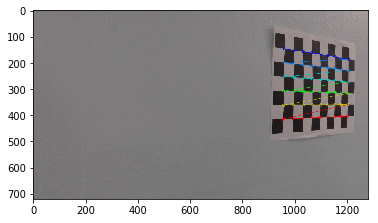

...

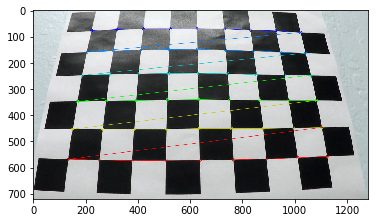

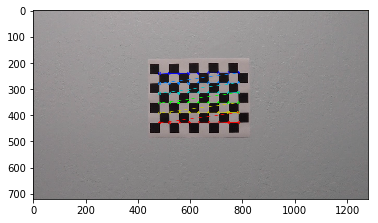

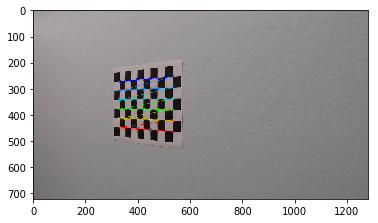

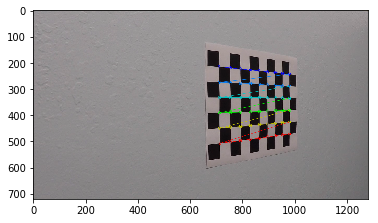

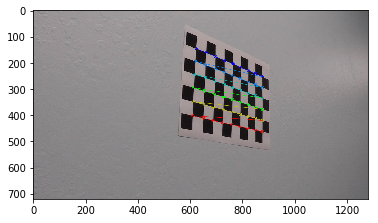

In [3]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = []
imgpoints = []

images = glob.glob('./camera_cal/calibration*.jpg')

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        plt.imshow(img)
        plt.show()

### Calibrate camera and def undistort method for an image

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

def plot_2_imgs(img1, img2, title1, title2, file_path=None):
    plot_n_imgs([img1,img2],[title1,title2],file_path)

def plot_n_imgs(imgs, titles, file_path=None):
    n = len(imgs)
    f, axs = plt.subplots(1, n, figsize=(20,10))
    for i in range(n):
        axs[i].imshow(imgs[i], cmap='gray')
        axs[i].set_title(titles[i], fontsize=30)
    
    if file_path is not None:
        f.savefig('./writeup_imgs/' + file_path)

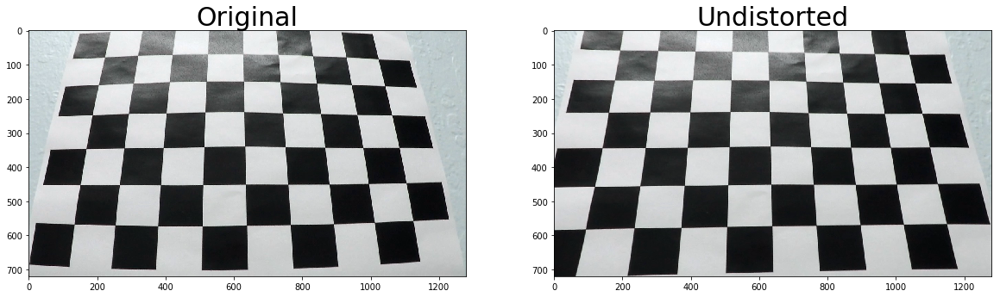

In [5]:
import pickle
import matplotlib.image as mpimg

img = cv2.imread('./camera_cal/calibration3.jpg')
img_size = (img.shape[1], img.shape[0])

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("./camera_cal/dist_pickle.p", "wb"))

def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

dst = undistort(img)
    
plot_2_imgs(img, dst, 'Original', 'Undistorted', 'undist.jpg')

---
## Next, I'll combine various thresholding operations to better detect lane lines

### Define and test color thresholding methods

In [6]:
def binary_thresh(img, thresh=(0, 255)):
    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary
    
# load test image
img = mpimg.imread('./test_images/test4.jpg')

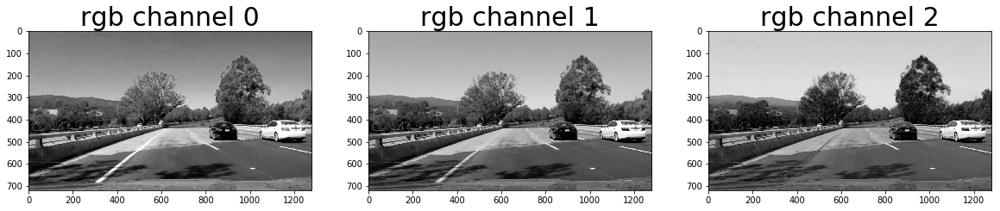

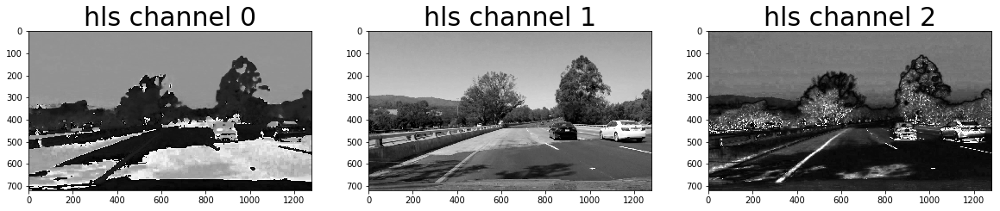

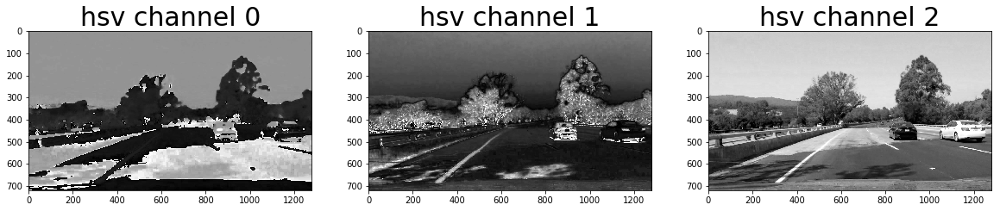

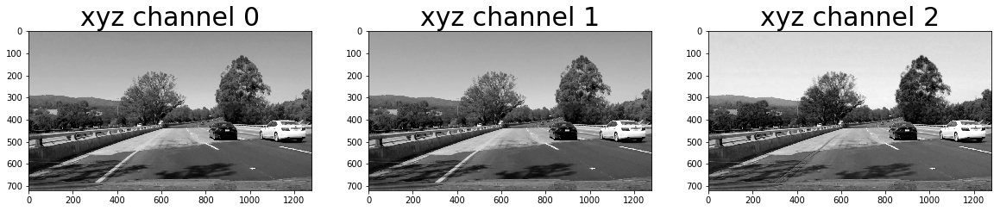

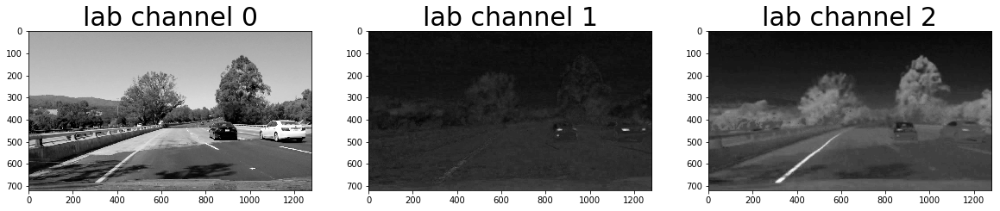

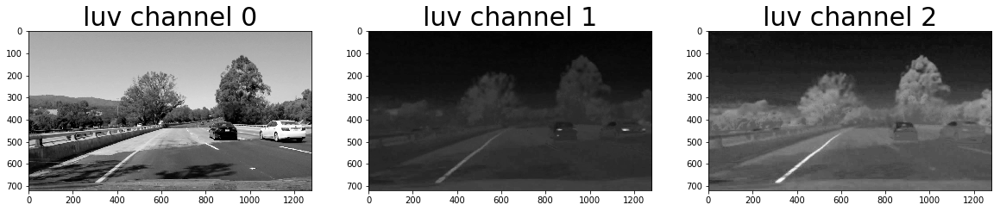

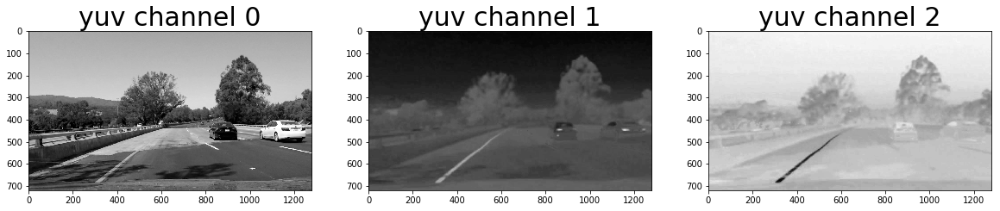

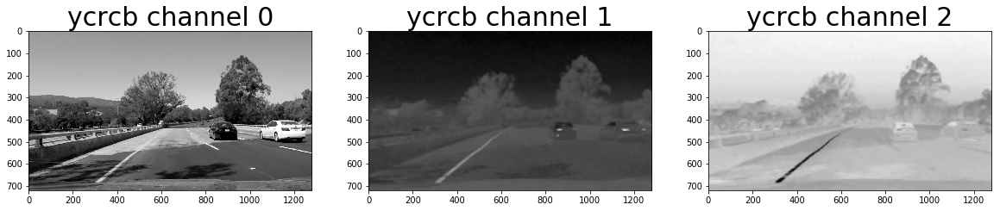

In [7]:
def explore_color_space(img, title):
    imgs = []
    titles = []
    for i in range(3):
        c = img[:,:,i]
        imgs.append(c)
        titles.append(title + ' channel ' + str(i))
    plot_n_imgs(imgs, titles, 'explore_color_space_'+title+'.jpg')
    
explore_color_space(img, 'rgb')

des = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
explore_color_space(des, 'hls')

des = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
explore_color_space(des, 'hsv')

des = cv2.cvtColor(img, cv2.COLOR_RGB2XYZ)
explore_color_space(des, 'xyz')

des = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
explore_color_space(des, 'lab')

des = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
explore_color_space(des, 'luv')

des = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
explore_color_space(des, 'yuv')

des = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
explore_color_space(des, 'ycrcb')

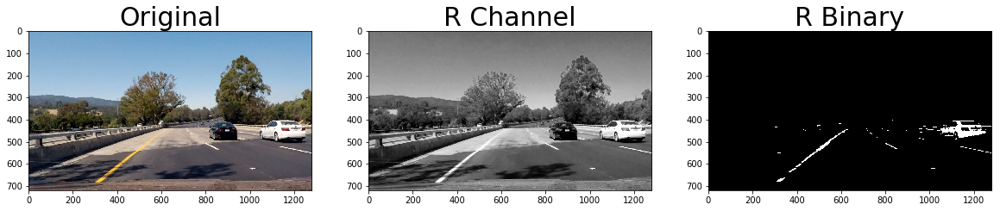

In [8]:
def r_binary(img, thresh=(225, 255)):
    c = img[:,:,0]
    c_bin = binary_thresh(c, thresh)
    return c_bin, c

# test and plot
des_bin, des = r_binary(img)
plot_n_imgs([img, des, des_bin], ['Original', 'R Channel', 'R Binary'], 'bin_r.jpg')

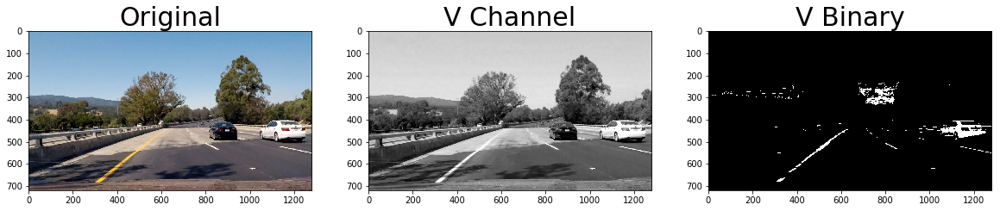

In [9]:
def v_binary(img, thresh=(225, 255)):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    c = hsv[:,:,2]
    c_bin = binary_thresh(c, thresh)
    return c_bin, c

des_bin, des = v_binary(img)
plot_n_imgs([img, des, des_bin], ['Original', 'V Channel', 'V Binary'], 'bin_v.jpg')

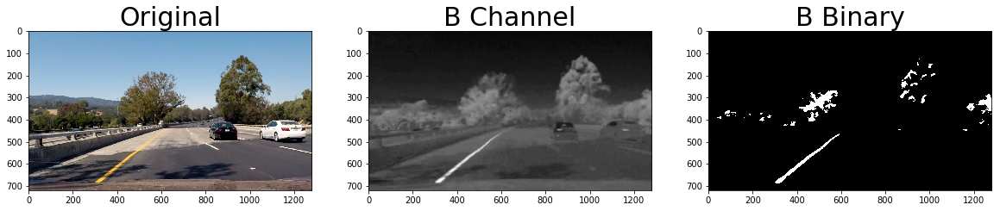

In [10]:
def b_binary(img, thresh=(150, 255)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    c = lab[:,:,2]
    c_bin = binary_thresh(c, thresh)
    return c_bin, c

des_bin, des = b_binary(img)
plot_n_imgs([img, des, des_bin], ['Original', 'B Channel', 'B Binary'], 'bin_b.jpg')

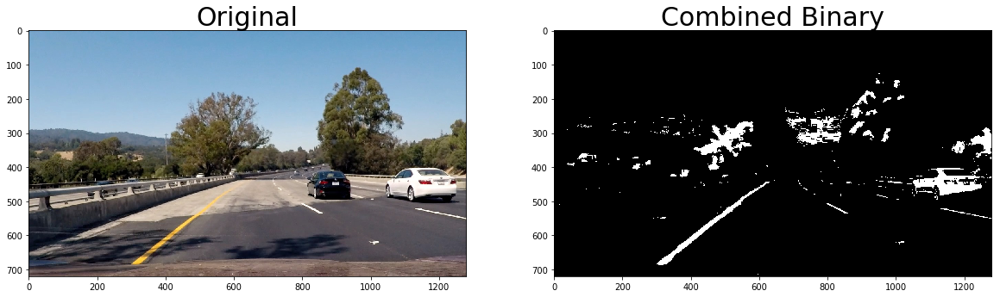

In [11]:
def combined_color_binary(img):
    r_bin, tmp = r_binary(img)
    v_bin, tmp = v_binary(img)
    b_bin, tmp = b_binary(img)
    
    combined = np.zeros_like(r_bin)
    combined[(r_bin==1) | (v_bin==1) | (b_bin==1)] = 1
    return combined

des = combined_color_binary(img)
plot_2_imgs(img, des, 'Original', 'Combined Binary', 'bin_color_comb.jpg')

### Define and test sobel thresholding methods

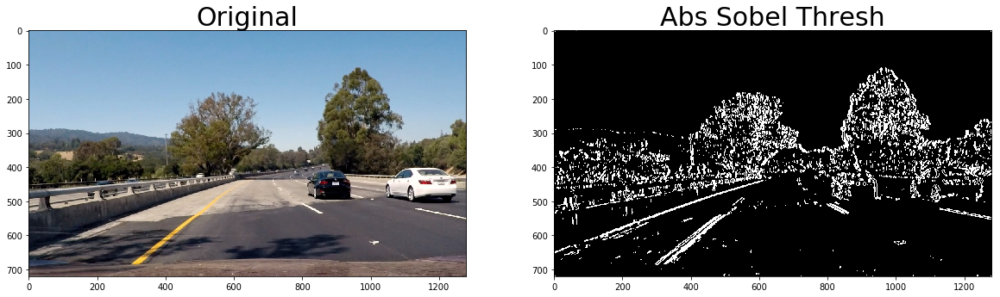

In [12]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=15, thresh=(20, 100)):
    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = img[:,:,0]
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    # Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(cv2.Sobel(s, cv2.CV_64F, orient=='x', orient=='y', ksize=sobel_kernel))
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude is between thresh
    binary_output = binary_thresh(scaled_sobel, thresh)
    
    # Return this mask as your binary_output image
    return binary_output

des = abs_sobel_thresh(img)
plot_2_imgs(img, des, 'Original', 'Abs Sobel Thresh', 'abs_sobel_thresh.jpg')

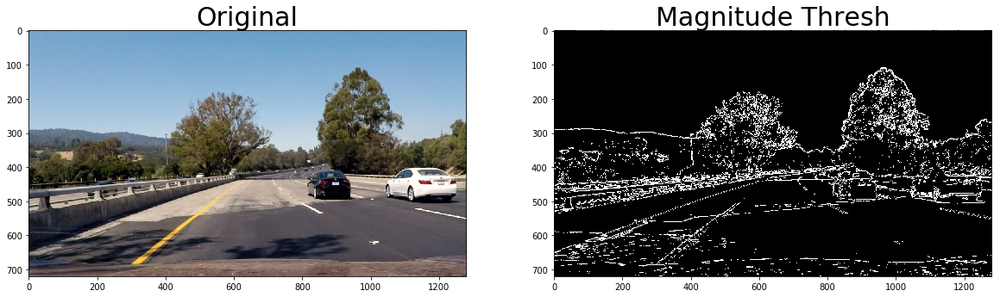

In [13]:
def mag_thresh(img, sobel_kernel=3, thresh=(30, 100)):
    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = img[:,:,2]
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(s, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(s, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the magnitude 
    mag = np.sqrt(sobelx**2 + sobely**2)
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(mag)/255
    mag = (mag/scale_factor).astype(np.uint8)
    
    # Create a binary mask where mag thresholds are met
    binary_output = binary_thresh(mag, thresh)
    
    # Return this mask as your binary_output image
    return binary_output

des = mag_thresh(img)
plot_2_imgs(img, des, 'Original', 'Magnitude Thresh', 'mag_thresh.jpg')

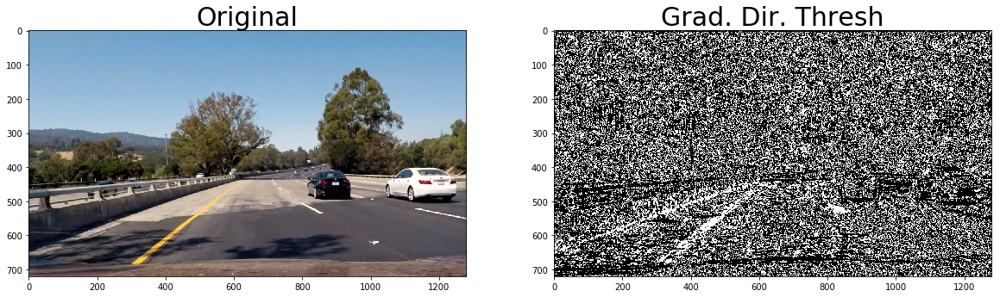

In [14]:
def dir_thresh(img, sobel_kernel=9, thresh=(0.7, 1.3)):
    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = img[:,:,0]
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(s, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(s, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # Create a binary mask where direction thresholds are met
    # Return this mask as your binary_output image
    binary_output = binary_thresh(absgraddir, thresh)
    
    return binary_output

des = dir_thresh(img)
plot_2_imgs(img, des, 'Original', 'Grad. Dir. Thresh', 'dir_thresh.jpg')

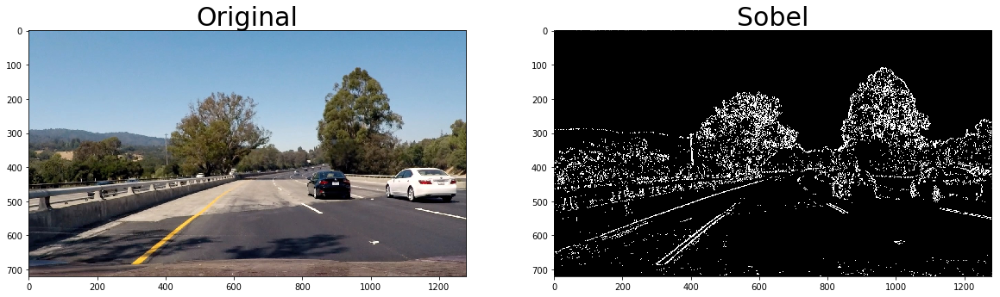

In [15]:
def combined_sobel_binary(img, sobel_kernel=3, sx_thresh=(20, 100), sy_thresh=(200, 255), m_thresh=(30, 100), d_thresh=(0.7, 1.3)):
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=sobel_kernel, thresh=sx_thresh)
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=sobel_kernel, thresh=sy_thresh)
    mag_bin = mag_thresh(img, sobel_kernel=sobel_kernel, thresh=m_thresh)
    dir_bin = dir_thresh(img, sobel_kernel=sobel_kernel, thresh=d_thresh)
    
    combined = np.zeros_like(dir_bin)
    combined[((gradx==1)) | ((mag_bin==1)&(dir_bin==1))] = 1
    return combined

# test and plot
ksize = 3
des = combined_sobel_binary(img, 
                     sobel_kernel=ksize)

plot_2_imgs(img, des, 'Original', 'Sobel', 'combined_sobel.jpg')

### Combine thresholding methods into single combined threshold pipeline

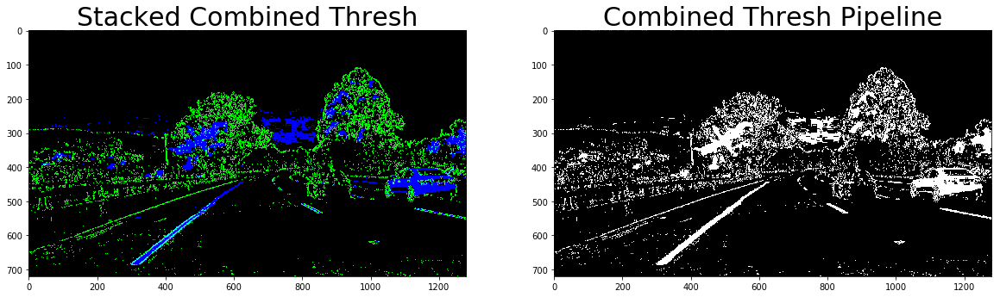

In [16]:
import numpy as np

def combined_thresh_stacked_output(img):
    img = np.copy(img)
    
    sobel_bin = combined_sobel_binary(img)
    color_bin = combined_color_binary(img)
    
    binary_output = np.dstack((np.zeros_like(sobel_bin), sobel_bin, color_bin))
    return binary_output

def combined_threshold_pipeline(img):
    img = np.copy(img)
    
    sobel_bin = combined_sobel_binary(img)
    color_bin = combined_color_binary(img)
    
    binary_output = np.zeros_like(sobel_bin)
    binary_output[(sobel_bin==1) | (color_bin==1)] = 255
    return binary_output

color_out = combined_thresh_stacked_output(img)
binary_out = combined_threshold_pipeline(img)

# Plot the result
plot_2_imgs(color_out, binary_out, 'Stacked Combined Thresh', 'Combined Thresh Pipeline', 'comb_thresh_pipeline.jpg')

---
## Next, I'll use perspecitve transform to give us a bird's eye view of the lane lines

### Investigate image of staright lane lines to define four points depicting a trapezoid region for transform

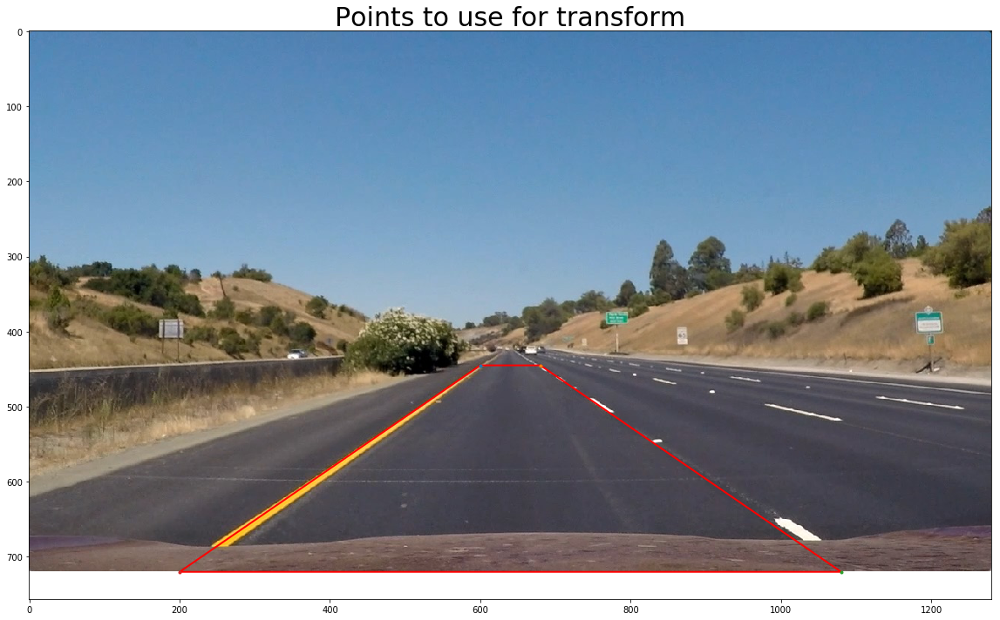

In [17]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
%matplotlib inline

top_x = 0.12
bottom_x = 0.65
top_y = 0.65
bottom_y = 0.935

img_size = (img.shape[1], img.shape[0])
    
offset_bot = (200,0)
offset_top = (40,0)

pt1 = [img_size[0]/2-offset_top[0],445] #[img.shape[1]*(.5-top_x/2),img.shape[0]*top_y]
pt2 = [img_size[0]/2+offset_top[0],445] #[img.shape[1]*(.5+top_x/2),img.shape[0]*top_y]
pt3 = [img_size[0] - offset_bot[0],720] #[img.shape[1]*(.5+bottom_x/2),img.shape[0]*bottom_y]
pt4 = [offset_bot[0],720] #[img.shape[1]*(.5-bottom_x/2),img.shape[0]*bottom_y]

pts = [pt1,pt2,pt3,pt4]

codes = [Path.MOVETO,
         Path.LINETO,
         Path.LINETO,
         Path.LINETO,
         Path.CLOSEPOLY,
        ]

path = Path([pt1,pt2,pt3,pt4,pt1],codes)

img = mpimg.imread('./test_images/straight_lines1.jpg')
undist = undistort(img)

f, ax = plt.subplots(figsize=(20,10))
ax.imshow(img)
ax.plot(pt1[0], pt1[1], '.')
ax.plot(pt2[0], pt2[1], '.')
ax.plot(pt3[0], pt3[1], '.')
ax.plot(pt4[0], pt4[1], '.')
patch = patches.PathPatch(path, facecolor='none', edgecolor='red', lw=2)
ax.add_patch(patch)
ax.set_title('Points to use for transform', fontsize=30)

f.savefig('./writeup_imgs/region_of_interest.jpg')

f.tight_layout()

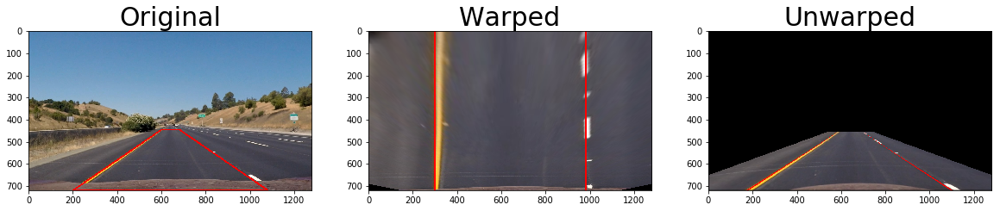

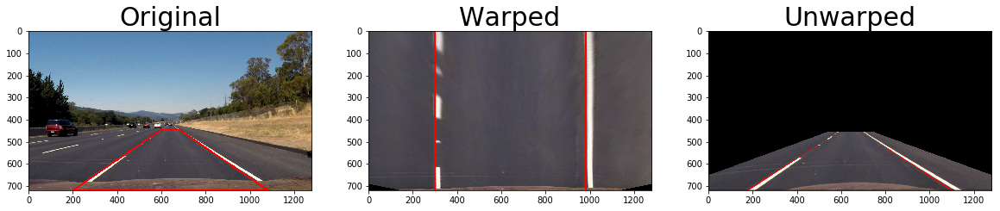

In [23]:
def get_M(img, pts):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32(pts)
    
    offset = 300 
    dst = np.float32(
        [(offset, -offset*1), 
         (img_size[0]-offset, -offset*1), 
         (img_size[0]-offset, img_size[1]), 
         (offset, img_size[1])])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

def transform(img, M):
    undist = undistort(img)
    return cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    
def draw_region(img, pts, color=[255,0,0], lwidth=5):
    img = np.copy(img)
    
    cv2.line(img, tuple([int(i) for i in pts[0]]), tuple([int(i) for i in pts[1]]), color, lwidth)
    cv2.line(img, tuple([int(i) for i in pts[1]]), tuple([int(i) for i in pts[2]]), color, lwidth)
    cv2.line(img, tuple([int(i) for i in pts[2]]), tuple([int(i) for i in pts[3]]), color, lwidth)
    cv2.line(img, tuple([int(i) for i in pts[3]]), tuple([int(i) for i in pts[0]]), color, lwidth)
    return img
    
M, Minv = get_M(img,pts)

images = glob.glob('./test_images/straight_lines*.jpg')

M, Minv = get_M(img,pts)
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    warped = transform(img,M)
    cv2.line(warped, (300, 720), (300, 0), [255,0,0], 5)
    cv2.line(warped, (img.shape[1]-300, 720), (img.shape[1]-300, 0), [255,0,0], 5)
    unwarped = transform(warped, Minv)
    plot_n_imgs([draw_region(img,pts),warped,unwarped],['Original','Warped','Unwarped'], 'straight_warped'+str(idx+1)+'.jpg')

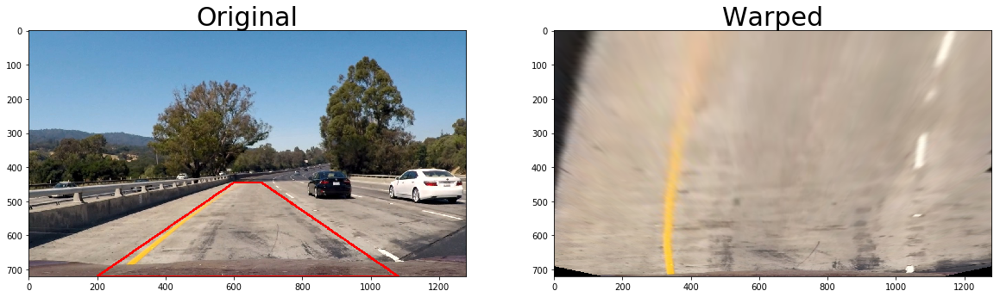

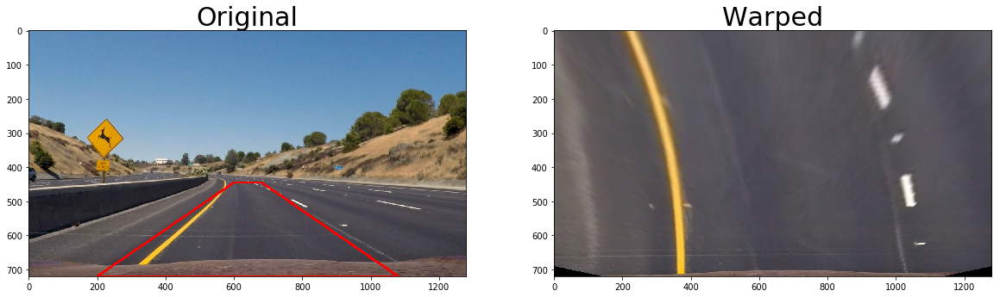

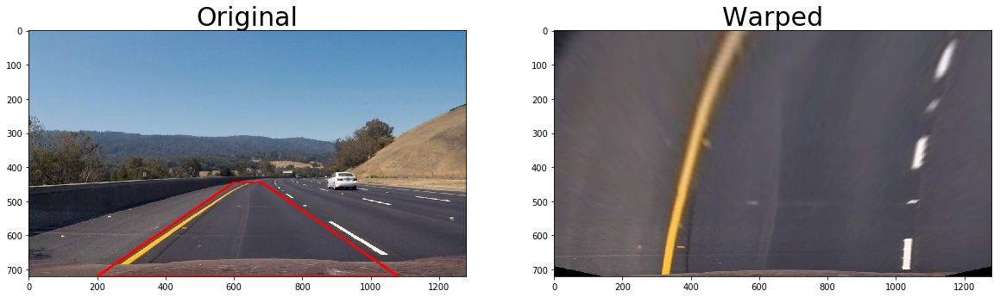

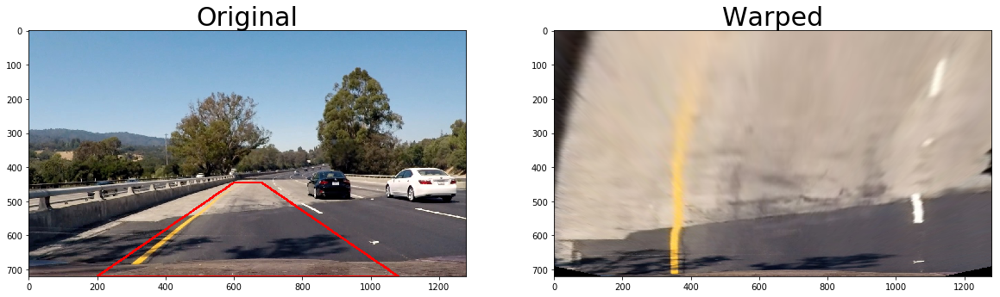

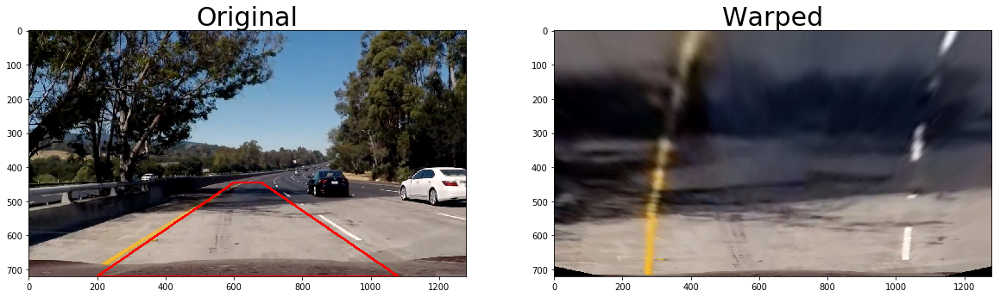

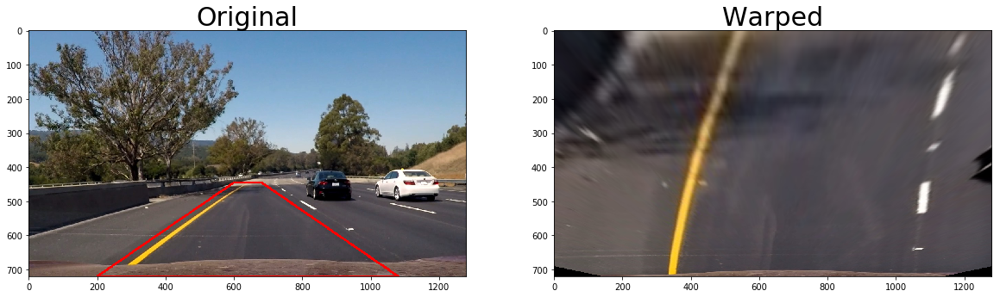

In [24]:
import glob
images = glob.glob('./test_images/test*.jpg')

M, Minv = get_M(img,pts)
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    warped = transform(img,M)
    plot_n_imgs([draw_region(img,pts),warped],['Original','Warped'], 'warped'+str(idx+1)+'.jpg')

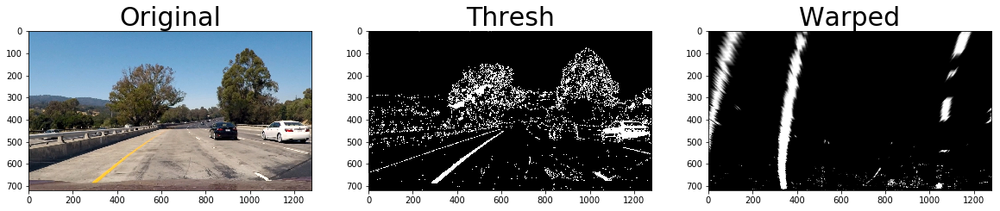

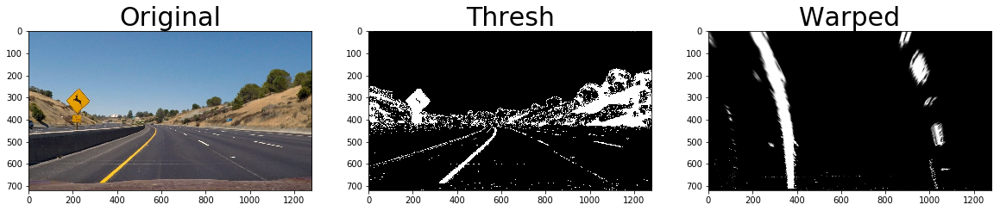

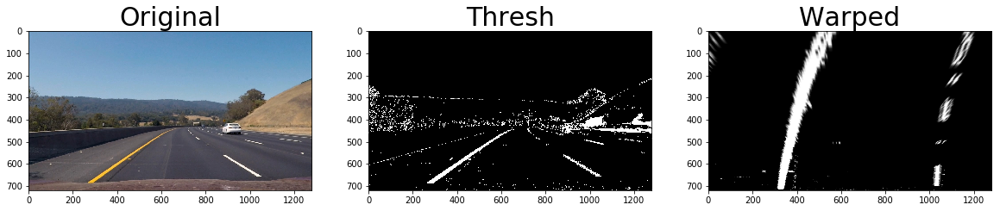

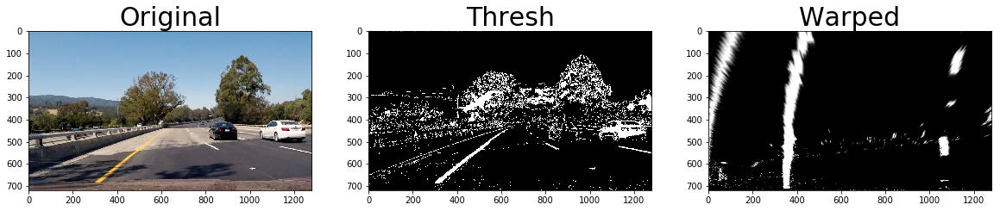

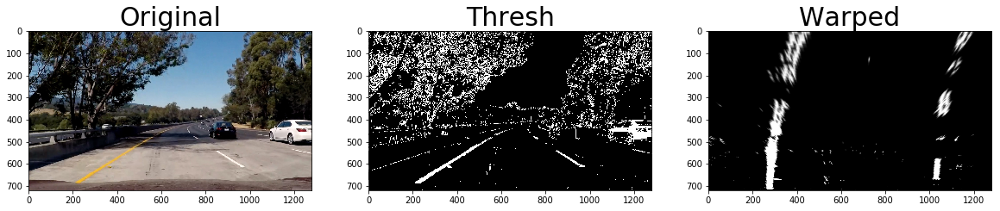

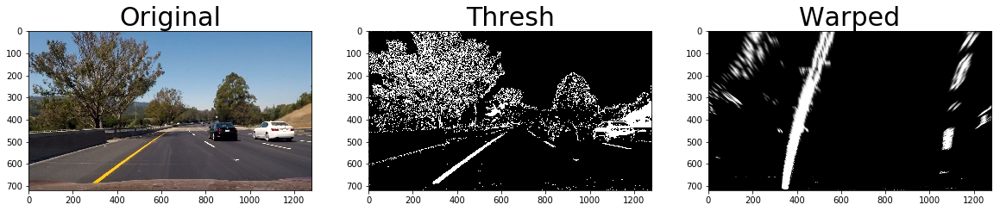

In [25]:
import glob
images = glob.glob('./test_images/test*.jpg')

M, Minv = get_M(img,pts)
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    img_thresh = combined_threshold_pipeline(img)
    warped = transform(img_thresh,M)
    plot_n_imgs([img,img_thresh,warped],['Original','Thresh','Warped'], 'thresh_warped'+str(idx+1)+'.jpg')

---
## Then I'll use the bird's eye view to find the lane lines

### Practice finding lane lines on one of the images

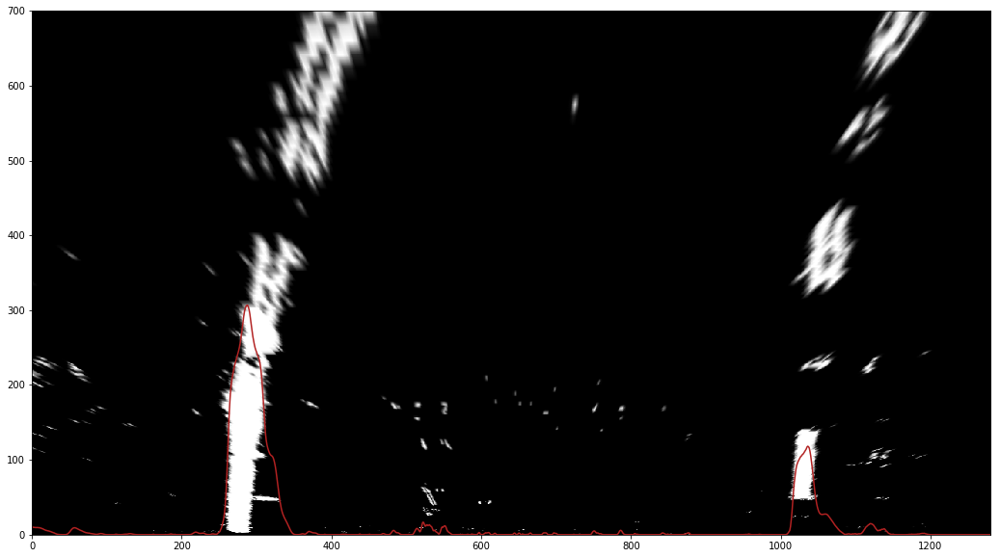

In [26]:
import numpy as np

img = mpimg.imread('./test_images/test5.jpg')
M, Minv = get_M(img,pts)
img_thresh = combined_threshold_pipeline(img)
warped = transform(img_thresh,M)
histogram = np.sum(warped[warped.shape[0]//2:,:]/255, axis=0)

f, ax = plt.subplots(figsize=(50,10))
x = range(350)
ax.imshow(warped, extent=[0,img.shape[1],0,700], cmap='gray')
ax.plot(histogram, color='firebrick')
f.savefig('./writeup_imgs/histogram.jpg')

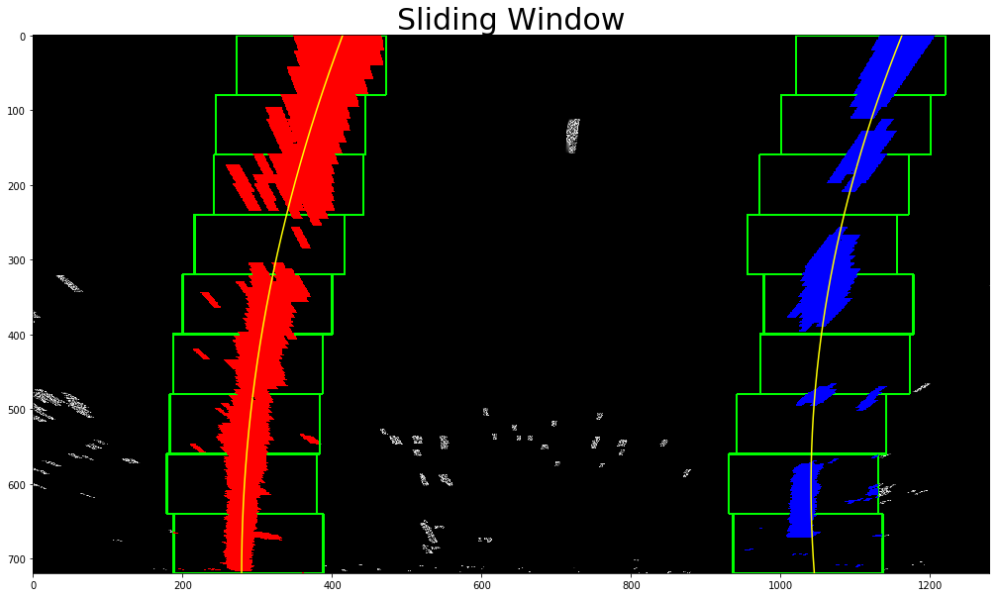

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2

img = mpimg.imread('./test_images/test5.jpg')
M, Minv = get_M(img,pts)
img_thresh = combined_threshold_pipeline(img)
warped = transform(img_thresh,M)
histogram = np.sum(warped[warped.shape[0]//2:,:]/255, axis=0)

out_img = np.array(cv2.merge((warped*255,warped*255,warped*255)),np.uint8) 
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = warped.shape[0] - (window+1)*window_height
    win_y_high = warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

f, ax = plt.subplots(figsize=(20,10))
ax.imshow(out_img, cmap='gray')
ax.plot(left_fitx, ploty, color='yellow')
ax.plot(right_fitx, ploty, color='yellow')
ax.set_title('Sliding Window', fontsize=30)
f.savefig('./writeup_imgs/sliding_window.jpg')

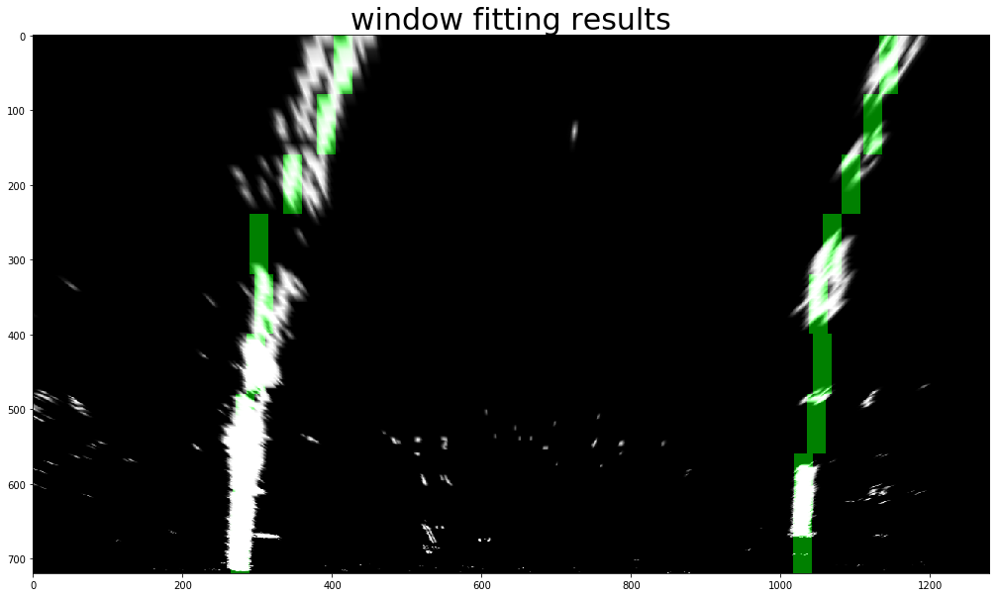

In [33]:
# window settings
window_width = 25 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 50 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, window_width, window_height, margin):
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    leftx = []
    rightx = []

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        leftx.append(window_centroids[level][0])
        rightx.append(window_centroids[level][1])
        
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results)
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped*255,warped*255,warped*255)),np.uint8)

f, ax = plt.subplots(figsize=(20,10))
ax.imshow(output)
ax.set_title('window fitting results', fontsize=30)


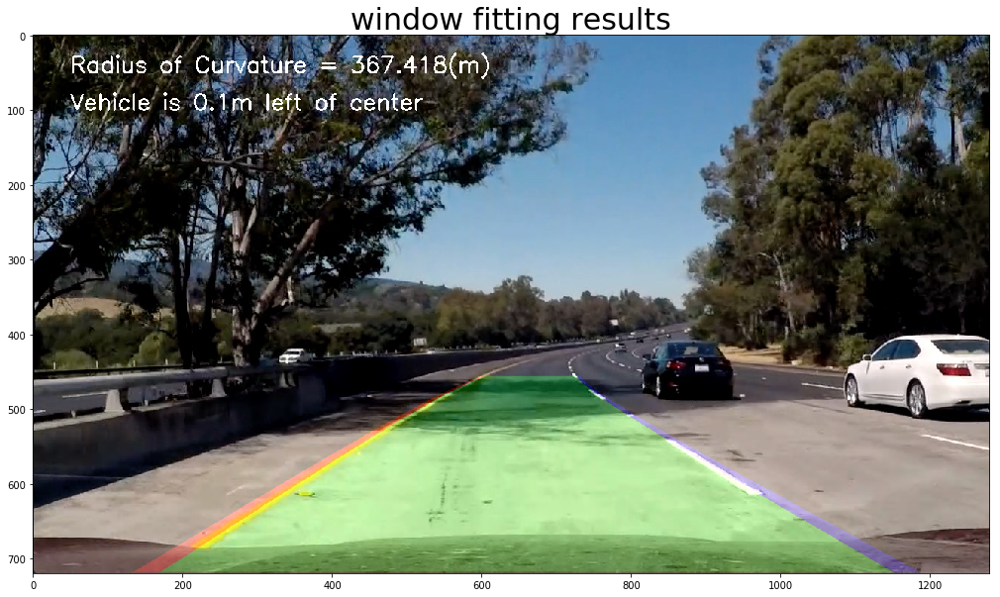

In [34]:
ym_per_pix = 30./720
xm_per_pix = 3.7/700

yvals = range(0, warped.shape[0])
res_yvals = np.arange(warped.shape[0]-(window_height/2), 0, -window_height)

left_fit = np.polyfit(res_yvals, leftx, 2)
left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
left_fitx = np.array(left_fitx, np.int32)

right_fit = np.polyfit(res_yvals, rightx, 2)
right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
right_fitx = np.array(right_fitx, np.int32)

left_lane = np.array(list(zip(np.concatenate((left_fitx-window_width/2, left_fitx[::-1]+window_width/2), axis=0),
                              np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
right_lane = np.array(list(zip(np.concatenate((right_fitx-window_width/2, right_fitx[::-1]+window_width/2), axis=0),
                              np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
inner_lane = np.array(list(zip(np.concatenate((left_fitx+window_width/2, right_fitx[::-1]-window_width/2), axis=0),
                              np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)

road = np.zeros_like(img)
road_bkg = np.zeros_like(img)
cv2.fillPoly(road,[left_lane],color=[255, 0, 0])
cv2.fillPoly(road,[right_lane],color=[0, 0, 255])
cv2.fillPoly(road,[inner_lane],color=[0,255,0])
#cv2.fillPoly(road_bkg,[left_lane],color=[255,255,255])
#cv2.fillPoly(road_bkg,[right_lane],color=[255,255,255])

road_warped = transform(road, Minv)
road_warped_bkg = transform(road_bkg, Minv)

base = cv2.addWeighted(img, 1.0, road_warped_bkg, -1.0, 0.0)
result = cv2.addWeighted(base, 1.0, road_warped, 0.25, 0.0)

curve_fit_cr = np.polyfit(np.array(res_yvals,np.float32)*ym_per_pix, np.array(leftx,np.float32)*xm_per_pix, 2)
curvead = ((1 + (2*curve_fit_cr[0]*yvals[-1]*ym_per_pix + curve_fit_cr[1])**2)**1.5) / np.absolute(2*curve_fit_cr[0])

camera_center = (left_fitx[-1] + right_fitx[-1])/2
center_diff = (camera_center-warped.shape[1]/2)*xm_per_pix
side_pos = 'left'
if center_diff <= 0:
    side_pos = 'right'
    
cv2.putText(result, 'Radius of Curvature = '+str(round(curvead,3))+'(m)', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
cv2.putText(result, 'Vehicle is '+str(abs(round(center_diff, 3)))+'m '+side_pos+' of center', (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

f, ax = plt.subplots(figsize=(20,10))
ax.imshow(result)
ax.set_title('window fitting results', fontsize=30)

In [35]:
def process_image(img):
    img_size = (img.shape[1], img.shape[0])
    
    offset_bot = (200,0)
    offset_top = (40,0)

    pt1 = [img_size[0]/2-offset_top[0],445] #[img.shape[1]*(.5-top_x/2),img.shape[0]*top_y]
    pt2 = [img_size[0]/2+offset_top[0],445] #[img.shape[1]*(.5+top_x/2),img.shape[0]*top_y]
    pt3 = [img_size[0] - offset_bot[0],720] #[img.shape[1]*(.5+bottom_x/2),img.shape[0]*bottom_y]
    pt4 = [offset_bot[0],720] #[img.shape[1]*(.5-bottom_x/2),img.shape[0]*bottom_y]
    
    M, Minv = get_M(img,pts)
    binary = combined_threshold_pipeline(img)
    warped = transform(binary,M)
    
    # window settings
    window_width = 25 
    window_height = 80 
    margin = 50 
    
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)
    
    if len(window_centroids) > 0:
        leftx = []
        rightx = []

        for level in range(0,len(window_centroids)):
            leftx.append(window_centroids[level][0])
            rightx.append(window_centroids[level][1])
        
    ym_per_pix = 10/720
    xm_per_pix = 5/400

    yvals = range(0, warped.shape[0])
    res_yvals = np.arange(warped.shape[0]-(window_height/2), 0, -window_height)

    left_fit = np.polyfit(res_yvals, leftx, 2)
    left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
    left_fitx = np.array(left_fitx, np.int32)

    right_fit = np.polyfit(res_yvals, rightx, 2)
    right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
    right_fitx = np.array(right_fitx, np.int32)

    left_lane = np.array(list(zip(np.concatenate((left_fitx-window_width/2, left_fitx[::-1]+window_width/2), axis=0),
                                  np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
    right_lane = np.array(list(zip(np.concatenate((right_fitx-window_width/2, right_fitx[::-1]+window_width/2), axis=0),
                                  np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
    inner_lane = np.array(list(zip(np.concatenate((left_fitx+window_width/2, right_fitx[::-1]-window_width/2), axis=0),
                              np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)

    road = np.zeros_like(img)
    cv2.fillPoly(road,[left_lane],color=[255, 0, 0])
    cv2.fillPoly(road,[right_lane],color=[0, 0, 255])
    cv2.fillPoly(road,[inner_lane],color=[0,255,0])
    road_warped = transform(road, Minv)
    result = cv2.addWeighted(img, 1.0, road_warped, 0.75, 0.0)

    curve_fit_cr = np.polyfit(np.array(res_yvals,np.float32)*ym_per_pix, np.array(leftx,np.float32)*xm_per_pix, 2)
    curvead = ((1 + (2*curve_fit_cr[0]*yvals[-1]*ym_per_pix + curve_fit_cr[1])**2)**1.5) / np.absolute(2*curve_fit_cr[0])

    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    center_diff = (camera_center-warped.shape[1]/2)*xm_per_pix
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'

    cv2.putText(result, 'Radius of Curvature = '+str(round(curvead,3))+'(m)', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, 'Vehicle is '+str(abs(round(center_diff, 3)))+'m '+side_pos+' of center', (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    return result

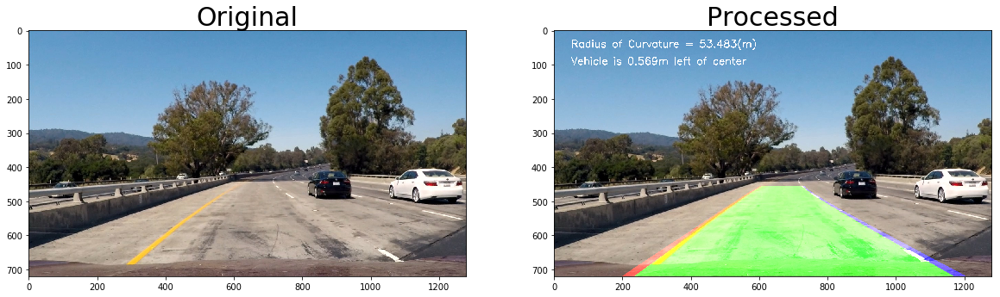

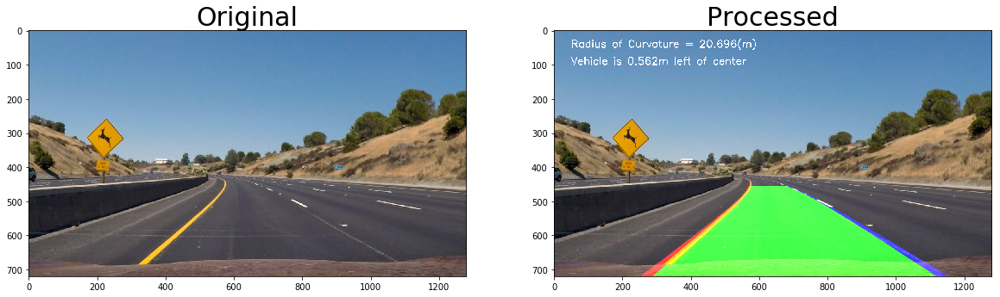

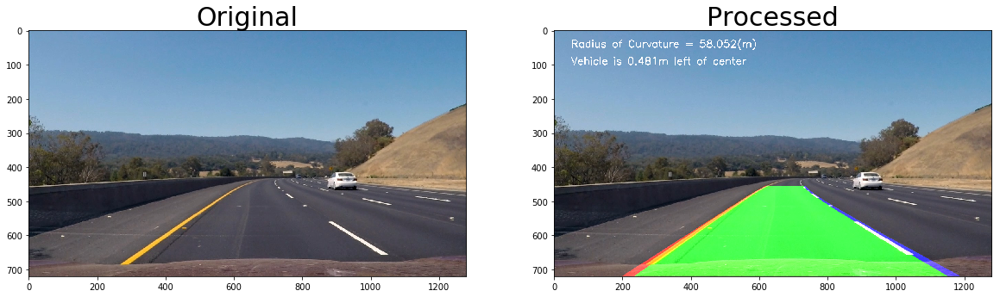

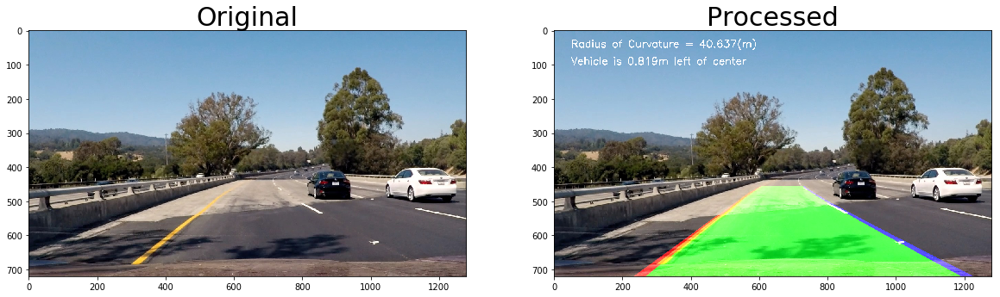

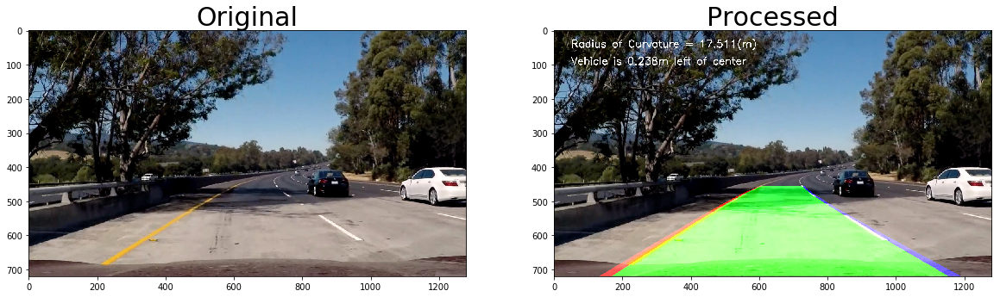

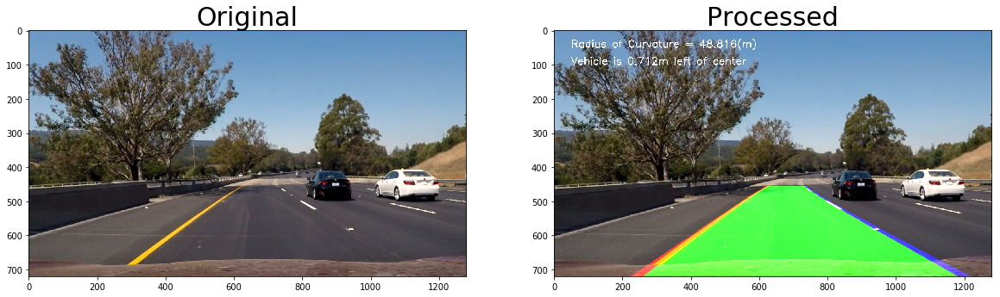

In [36]:
import glob
images = glob.glob('./test_images/test*.jpg')

for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    warped = process_image(img)
    plot_n_imgs([img,warped],['Original','Processed'], 'processed'+str(idx+1)+'.jpg')

In [37]:
from moviepy.editor import VideoFileClip

project_vid = 'project_video.mp4'
output_vid = 'project_video_out.mp4'

clip = VideoFileClip(project_vid)
vid_clip = clip.fl_image(process_image)
%time vid_clip.write_videofile(output_vid, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [03:56<00:00,  5.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 5min 11s, sys: 46.1 s, total: 5min 57s
Wall time: 3min 57s


In [38]:
from moviepy.editor import VideoFileClip

project_vid = 'challenge_video.mp4'
output_vid = 'challenge_video_out.mp4'

clip = VideoFileClip(project_vid)
vid_clip = clip.fl_image(process_image)
%time vid_clip.write_videofile(output_vid, audio=False)

[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4


100%|██████████| 485/485 [01:32<00:00,  5.58it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out.mp4 

CPU times: user 2min 2s, sys: 16.7 s, total: 2min 18s
Wall time: 1min 32s


In [39]:
from moviepy.editor import VideoFileClip

project_vid = 'harder_challenge_video.mp4'
output_vid = 'harder_challenge_video_out.mp4'

clip = VideoFileClip(project_vid)
vid_clip = clip.fl_image(process_image)
%time vid_clip.write_videofile(output_vid, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|█████████▉| 1199/1200 [03:56<00:00,  5.17it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

CPU times: user 5min 9s, sys: 43 s, total: 5min 52s
Wall time: 3min 56s
